In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch.nn as nn
import torch
from datetime import datetime
import pandas as pd
from transformers import AutoImageProcessor, AutoModel, AutoTokenizer
import numpy as np

from sentence_transformers import SentenceTransformer
from torch.utils.data import Dataset, DataLoader, random_split, Subset


from pathlib import Path
from PIL import Image


## IMPORT

#### DATA

In [ ]:
!unzip "/content/drive/MyDrive/Data Science/tinyvlm/tinyvlm/data/image-description-marketplace-data.zip" -d "/content/flip_data_vlm"

Streaming output truncated to the last 5000 lines.
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Хаб_1163.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Хаб_1166.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Хаб_Promt_1243.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Хаб_Quadro_Express_1438.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Хаб_Quadro_Infix_1542.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Хаб_Universal_RS050_5850.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Цветной_чехол_на_IPhone_14_Pro_Max_с_функцией_MagS_881.jpg  
  inflating: /content/flip_data_vlm/flip_data_vlm/flip_data_vlm/category_4/images/Цветной_чехол_на_IPhone_14_Pro_Max_с_функцией_MagS_882.jpg  
  inflating: /content/flip_data

##### RELOAD DATASET

In [ ]:
class ImageTitleWithClipDataset(Dataset):
    def __init__(self, data):
        """
        data: list of dicts with keys:
          - image_path
          - text
          - image_embedding (CLIP)
          - text_embedding (CLIP)
        """
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        item = self.data[index]
        return (
            item["image_path"],         # PIL image will be loaded in training loop
            item["text"],               # text
            item["image_embedding"],    # CLIP image embedding (tensor)
            item["text_embedding"]      # CLIP text embedding (tensor)
        )

In [ ]:
# Load the data from the .pt file
loaded_data = torch.load("/content/drive/MyDrive/Data Science/tinyvlm/tinyvlm/data/image_paths_with_clip_embeddings_large_ft.pt")

# Initialize the dataset with the loaded data
dataset = ImageTitleWithClipDataset(loaded_data)

##### RELOAD INDICIES

In [ ]:
indices_dict = torch.load("/content/drive/MyDrive/Data Science/tinyvlm/tinyvlm/data/train_val_indices.pt")
val_indices = indices_dict["val_indices"]

val_dataset = Subset(dataset, val_indices)

In [ ]:

val_dataloader = DataLoader(val_dataset, batch_size=256, shuffle=False)

In [ ]:
len(val_dataloader)

12

In [ ]:
image, text, image_embedding, text_embedding = val_dataset[92]

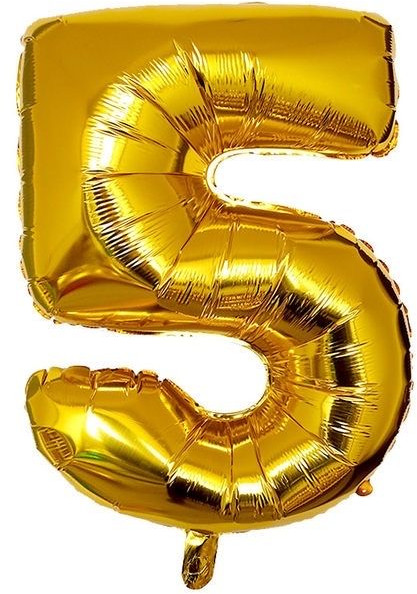

In [ ]:
Image.open(image)

In [ ]:
text

'Foil ball in the form of "number 5"'

## MODEL LOAD

#### ARCHITECTURE

In [ ]:
!hf auth login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) y
Token is valid (permission: fineGrained).
The token `tken` has been saved to /root/.cache/huggingface/stored_tokens
Cannot authenticate through git-credential as no helper is defined on your machine.
You might have to re-authenticate whe

In [ ]:
class DinoMiniLMDualEncoder(nn.Module):
    def __init__(self):
        super().__init__()

        # Text encoder (MiniLM)
        self.text_encoder = AutoModel.from_pretrained("sentence-transformers/all-MiniLM-L12-v2")
        self.text_tokenizer = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L12-v2")

        # Image encoder (DINO)
        self.image_encoder = AutoModel.from_pretrained("facebook/dinov3-vits16-pretrain-lvd1689m")
        self.image_processor = AutoImageProcessor.from_pretrained("facebook/dinov3-vits16-pretrain-lvd1689m")

        # Projection layers
        self.image_projection = nn.Linear(in_features=384, out_features=768)
        self.text_projection = nn.Linear(in_features=384, out_features=768)

    def forward(self, image, text):
        device = next(self.parameters()).device  # model's device (cpu/cuda)

        # --- Text encoding ---
        text_inputs = self.text_tokenizer(
            text, return_tensors="pt", padding=True, truncation=True
        ).to(device)
        text_outputs = self.text_encoder(**text_inputs)
        text_embeddings = text_outputs.last_hidden_state.mean(dim=1)
        text_embeddings = self.text_projection(text_embeddings)

        # --- Image encoding ---
        image_processed = self.image_processor(images=image, return_tensors="pt").to(device)
        image_outputs = self.image_encoder(**image_processed)
        image_embeddings = self.image_projection(image_outputs.pooler_output)

        return text_embeddings, image_embeddings









#### STAGE1 LOAD

In [ ]:
dino_minilm_stage1 = DinoMiniLMDualEncoder().to('cuda')

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/352 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/86.4M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/585 [00:00<?, ?B/s]

In [ ]:
#### RELOAD WEIGHTS

dino_minilm_stage1_state_dict = torch.load("/content/drive/MyDrive/Data Science/tinyvlm//tinyvlm/models/dino_minilm_stage1v2.pth")
dino_minilm_stage1.load_state_dict(dino_minilm_stage1_state_dict)





<All keys matched successfully>

In [ ]:
sum(p.numel() for p in dino_minilm_stage1.parameters() if p.requires_grad == True)

55547904

#### STAGE2

In [ ]:
dino_minilm_stage2 = DinoMiniLMDualEncoder().to('cuda')

In [ ]:
#### RELOAD WEIGHTS

dino_minilm_stage2_state_dict = torch.load("/content/drive/MyDrive/Data Science/tinyvlm//tinyvlm/models/dino_minilm_stage2v2.pth")
dino_minilm_stage2.load_state_dict(dino_minilm_stage2_state_dict)

<All keys matched successfully>

## TESTS

##### FUNCTIONS

In [ ]:
def encode_query(query, model, is_image = False):

  if is_image == False:
    query_embedding = model.text_encoder(**model.text_tokenizer(query, return_tensors="pt").to('cuda')).last_hidden_state.mean(dim=1)
    query_embedding = model.text_projection(query_embedding)


  else:
    query_embedding = model.image_encoder(**model.image_processor(images=query, return_tensors="pt").to('cuda')).pooler_output
    query_embedding = model.image_projection(query_embedding)


  return query_embedding

In [ ]:
def find_most_similar(query_embedding, embeddings_list, top_k=5, image=False):
    """
    Find most similar items (images or texts) given a query embedding.

    Args:
        query_embedding: Tensor of shape [1, dim]
        embeddings_list: list of dicts with keys:
            {"image_path", "embedding"} if image=True
            {"text", "embedding"} if image=False
        top_k: number of top matches to return
        image: whether we're searching among image embeddings (bool)
    """
    device = torch.device("cuda")

    # Move query to device
    query_embedding = F.normalize(query_embedding.detach().to(device), dim=1)

    # Stack and normalize embeddings
    all_embeddings = torch.stack([item["embedding"].to(device) for item in embeddings_list])
    all_embeddings = F.normalize(all_embeddings, dim=1)

    # Compute cosine similarities
    similarities = (all_embeddings @ query_embedding.T).squeeze(1)

    # Top-k indices
    topk_indices = similarities.topk(top_k).indices.tolist()

    # Retrieve results
    if image:
        top_items = [embeddings_list[i]["image_path"] for i in topk_indices]
    else:
        top_items = [embeddings_list[i]["text"] for i in topk_indices]

    top_scores = [similarities[i].item() for i in topk_indices]

    return list(zip(top_items, top_scores))


In [ ]:
from IPython.display import display
from matplotlib import pyplot as plt

def show_images(results, title="Top Matches"):
    """
    results: list of image paths or list of (image_path, score) tuples
    """
    # Extract image paths and optional scores
    if isinstance(results[0], tuple):
        image_paths, scores = zip(*results)
    else:
        image_paths = results
        scores = None

    num_images = len(image_paths)
    plt.figure(figsize=(4 * num_images, 5))
    plt.suptitle(title, fontsize=16)

    for i, img_path in enumerate(image_paths):
        img = Image.open(img_path).convert("RGB")
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis("off")

        if scores is not None:
            plt.title(f"{scores[i]:.3f}", fontsize=10)

    plt.tight_layout()
    plt.show()

In [96]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def plot_similarity_matrix(sim_matrix, items, title="Similarity Matrix", image=True):
    """
    Plots a similarity matrix with either images or text labels around it.

    Args:
        sim_matrix (Tensor or np.ndarray): square similarity matrix [N x N]
        items (list): list of PIL images if image=True, or list of strings if image=False
        title (str): title of the plot
        image (bool): whether to visualize images (True) or text labels (False)
    """
    n = len(items)
    fig = plt.figure(figsize=(12, 12))
    fig.suptitle(title, fontsize=18, y=1.02)

    gs = gridspec.GridSpec(
        n + 1, n + 1,
        width_ratios=[2.3] + [4]*n,
        height_ratios=[2.3] + [4]*n,
        wspace=0.0, hspace=0.0
    )

    # --- Top row ---
    for i, item in enumerate(items):
        ax = plt.subplot(gs[0, i + 1])
        if image:
            ax.imshow(item)
            ax.axis("off")
        else:
            ax.text(0.5, 0.5, str(item), ha="center", va="center", wrap=True, fontsize=9)
            ax.axis("off")
        ax.set_anchor("S")

    # --- Left column ---
    for i, item in enumerate(items):
        ax = plt.subplot(gs[i + 1, 0])
        if image:
            ax.imshow(item)
            ax.axis("off")
        else:
            ax.text(0.5, 0.5, str(item), ha="center", va="center", wrap=True, rotation=0, fontsize=9)
            ax.axis("off")
        ax.set_anchor("E")

    # --- Similarity matrix ---
    ax = plt.subplot(gs[1:, 1:])
    im = ax.imshow(sim_matrix, cmap="coolwarm", vmin=-1, vmax=1)
    ax.set_xticks([])
    ax.set_yticks([])

    # Annotate similarity values
    for i in range(n):
        for j in range(n):
            ax.text(
                j, i, f"{sim_matrix[i, j]:.2f}",
                ha="center", va="center",
                color="black", fontsize=9, fontweight="bold"
            )

    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    plt.show()


#### VALIDATION SET LOSS TEST

In [ ]:
import torch.nn.functional as F

def contrastive_loss(image_embeddings, text_embeddings, temperature=0.07):
    """
    Compute contrastive loss between image and text embeddings (symmetric InfoNCE).

    Args:
        image_embeddings: Tensor of shape [batch_size, dim]
        text_embeddings: Tensor of shape [batch_size, dim]
        temperature: Scaling factor for logits (default 0.07)

    Returns:
        loss: Scalar contrastive loss value
        metrics: Dict containing cosine similarities and accuracy for monitoring
    """
    # Normalize embeddings to unit length
    image_embeddings = F.normalize(image_embeddings, p=2, dim=1)
    text_embeddings = F.normalize(text_embeddings, p=2, dim=1)

    # Similarity matrix [batch, batch]
    logits = image_embeddings @ text_embeddings.T / temperature

    # Ground-truth targets (diagonal matches)
    targets = torch.arange(len(logits), device=logits.device)

    # Symmetric InfoNCE loss
    loss_i2t = F.cross_entropy(logits, targets)  # image -> text
    loss_t2i = F.cross_entropy(logits.T, targets)  # text -> image
    loss = (loss_i2t + loss_t2i) / 2

    # Compute validation metrics (alignment quality)
    with torch.no_grad():
        # Image→Text retrieval accuracy
        i2t_acc = (logits.argmax(dim=1) == targets).float().mean().item()
        # Text→Image retrieval accuracy
        t2i_acc = (logits.argmax(dim=0) == targets).float().mean().item()

    metrics = {
        "loss": loss.item(),
        "i2t_acc": i2t_acc,
        "t2i_acc": t2i_acc,
        "mean_acc": (i2t_acc + t2i_acc) / 2
    }

    return loss, metrics

In [ ]:


stage1_losses = []
stage2_losses = []


with torch.no_grad():

  for batch , (image_paths, texts, clip_image_embeddings, clip_text_embeddings) in enumerate(val_dataloader):

    pil_images = [Image.open(p).convert("RGB") for p in image_paths]

    minilm_stage1_embeddings, dino_stage1_embeddings = dino_minilm_stage1(pil_images, texts)
    minilm_stage2_embeddings, dino_stage2_embeddings = dino_minilm_stage2(pil_images, texts)

    dino_minilm_stage1_loss, dino_minilm_stage1_metrics = contrastive_loss(dino_stage1_embeddings, minilm_stage1_embeddings)
    dino_minilm_stage2_loss, dino_minilm_stage2_metrics = contrastive_loss(dino_stage2_embeddings, minilm_stage2_embeddings)


    stage1_losses.append(dino_minilm_stage1_loss.item())
    stage2_losses.append(dino_minilm_stage2_loss.item())


    print(f"processed batch {batch}/{len(val_dataloader)}")

#### AVGING
stage1_model_mean_loss = np.mean(stage1_losses)
stage2_model_mean_loss = np.mean(stage2_losses)

print(f"Stage1 model mean loss: {stage1_model_mean_loss}")
print(f"Stage2 model mean loss: {stage2_model_mean_loss}")

processed batch 0/12
processed batch 1/12
processed batch 2/12
processed batch 3/12
processed batch 4/12
processed batch 5/12
processed batch 6/12
processed batch 7/12
processed batch 8/12
processed batch 9/12
processed batch 10/12
processed batch 11/12
Stage1 model mean loss: 1.357252150774002
Stage2 model mean loss: 1.653552879889806


#### TEXT QUERY TEST

##### ENCODING

In [ ]:
general_dataloader = DataLoader(dataset, batch_size=860, shuffle=False)

list_image_embeddings_stage1 = []
list_image_embeddings_stage2 = []

with torch.no_grad():
    for batch, (image_paths, texts, clip_image_embeddings, clip_text_embeddings) in enumerate(general_dataloader):
        pil_images = [Image.open(p).convert("RGB") for p in image_paths]

        # Get embeddings from both stages
        _, img_emb_stage1 = dino_minilm_stage1(pil_images, texts)
        _, img_emb_stage2 = dino_minilm_stage2(pil_images, texts)

        img_emb_stage1 = img_emb_stage1.cpu()
        img_emb_stage2 = img_emb_stage2.cpu()

        # Store per image (zip ensures correct pairing)
        for path, text, emb1, emb2 in zip(image_paths, texts, img_emb_stage1, img_emb_stage2):
            list_image_embeddings_stage1.append({
                "image_path": path,
                "text": text,
                "embedding": emb1
            })
            list_image_embeddings_stage2.append({
                "image_path": path,
                "text": text,
                "embedding": emb2
            })

        print(f'Processed batch {batch + 1}/{len(general_dataloader)}')




Processed batch 1/34
Processed batch 2/34
Processed batch 3/34
Processed batch 4/34
Processed batch 5/34
Processed batch 6/34
Processed batch 7/34
Processed batch 8/34
Processed batch 9/34
Processed batch 10/34
Processed batch 11/34
Processed batch 12/34
Processed batch 13/34
Processed batch 14/34
Processed batch 15/34
Processed batch 16/34
Processed batch 17/34
Processed batch 18/34
Processed batch 19/34
Processed batch 20/34
Processed batch 21/34
Processed batch 22/34
Processed batch 23/34
Processed batch 24/34
Processed batch 25/34
Processed batch 26/34
Processed batch 27/34
Processed batch 28/34
Processed batch 29/34
Processed batch 30/34
Processed batch 31/34
Processed batch 32/34
Processed batch 33/34
Processed batch 34/34


In [ ]:
torch.save(list_image_embeddings_stage1, "/content/drive/MyDrive/Data Science/tinyvlm/tinyvlm/data/list_embeddings_stage1v2.pt")
torch.save(list_image_embeddings_stage2, "/content/drive/MyDrive/Data Science/tinyvlm/tinyvlm/data/list_embeddings_stage2v2.pt")

print("Saved both embedding lists successfully.")


Saved both embedding lists successfully.


##### QUERY 1

In [46]:


query = "teapot"

#### stage1 model

query_embedding_stage1 = encode_query(query, dino_minilm_stage1)

top_images_stage1 = find_most_similar(query_embedding_stage1, list_image_embeddings_stage1, top_k=5, image = True)



#### stage2 model

query_embedding_stage2 = encode_query(query, dino_minilm_stage2)


top_images_stage2 = find_most_similar(query_embedding_stage2, list_image_embeddings_stage2, top_k=5, image = True)









In [54]:
list_image_embeddings_stage2[42]['embedding'].shape

torch.Size([768])

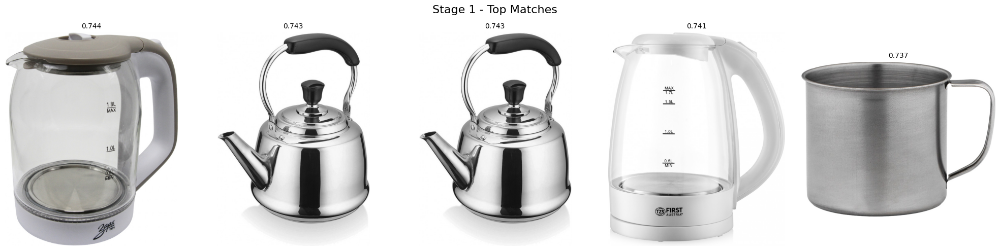

In [47]:
#### DISPLAY
show_images(top_images_stage1, "Stage 1 - Top Matches")

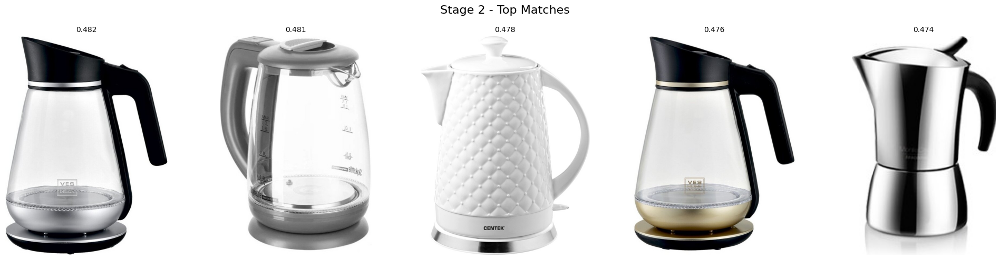

In [ ]:
show_images(top_images_stage2, "Stage 2 - Top Matches")

##### QUERY 2

In [55]:
query2 = "artificial flowers"


#### stage1 model

query2_embedding_stage1 = encode_query(query2, dino_minilm_stage1)

top_images_stage1_query2 = find_most_similar(query2_embedding_stage1, list_image_embeddings_stage1, top_k=5, image = True)


#### stage2 model

query2_embedding_stage2 = encode_query(query2, dino_minilm_stage2)

top_images_stage2_query2 = find_most_similar(query2_embedding_stage2, list_image_embeddings_stage2, top_k=5, image = True)

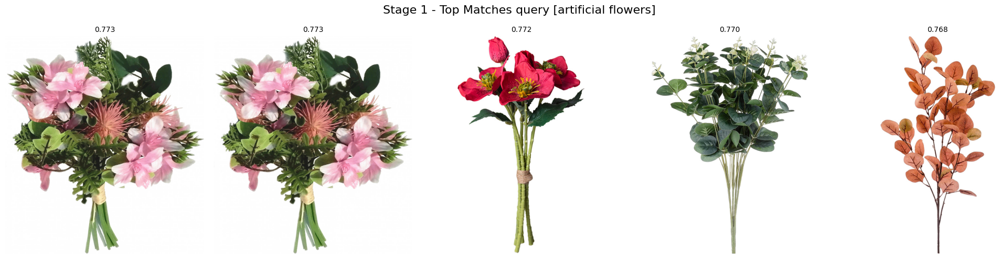

In [56]:
#### DISPLAY
show_images(top_images_stage1_query2, "Stage 1 - Top Matches query [artificial flowers] ")

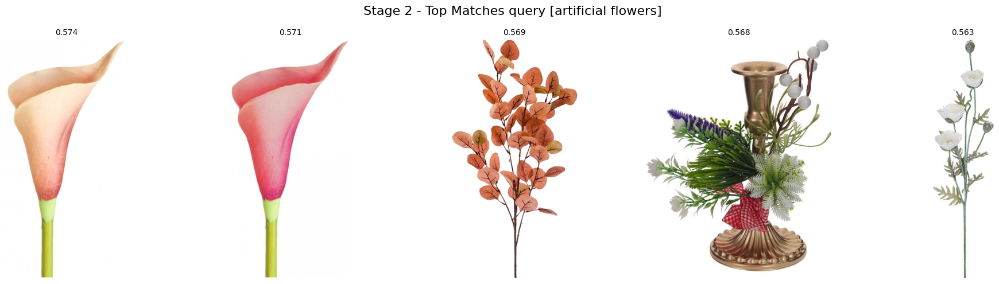

In [57]:
#### DISPLAY
show_images(top_images_stage2_query2, "Stage 2 - Top Matches query [artificial flowers] ")

##### QUERY 3

In [61]:
query3 = "men white sneakers"


#### stage1 model

query3_embedding_stage1 = encode_query(query3, dino_minilm_stage1)

top_images_stage1_query3 = find_most_similar(query3_embedding_stage1, list_image_embeddings_stage1, top_k=5, image = True)


#### stage2 model

query3_embedding_stage2 = encode_query(query3, dino_minilm_stage2)

top_images_stage2_query3 = find_most_similar(query3_embedding_stage2, list_image_embeddings_stage2, top_k=5, image = True)

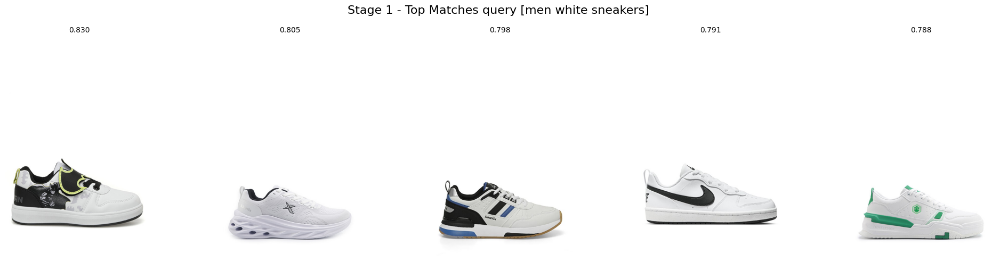

In [62]:
#### DISPLAY
show_images(top_images_stage1_query3, "Stage 1 - Top Matches query [men white sneakers] ")

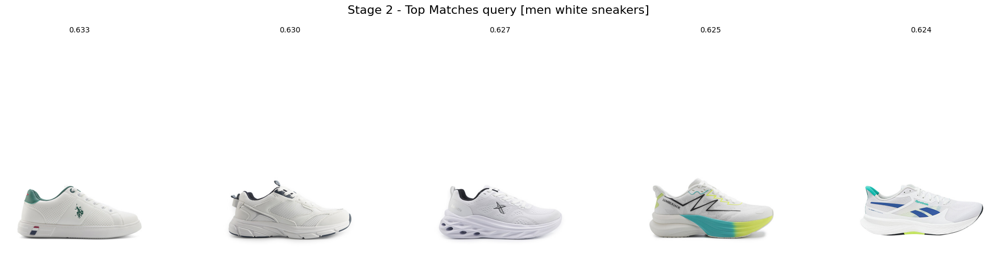

In [63]:
#### DISPLAY
show_images(top_images_stage2_query3, "Stage 2 - Top Matches query [men white sneakers] ")

#### IMAGE SEARCH TEST

##### QUERY 1

In [64]:
from transformers.image_utils import load_image

In [65]:
image_query1_url = "https://blissclub.com/cdn/shop/files/Thumbnail-1_6e290c5a-75a7-4e1b-b885-a34a3967160e.jpg?v=1703666587&width=1080"
image_query1 = load_image(image_query1_url)

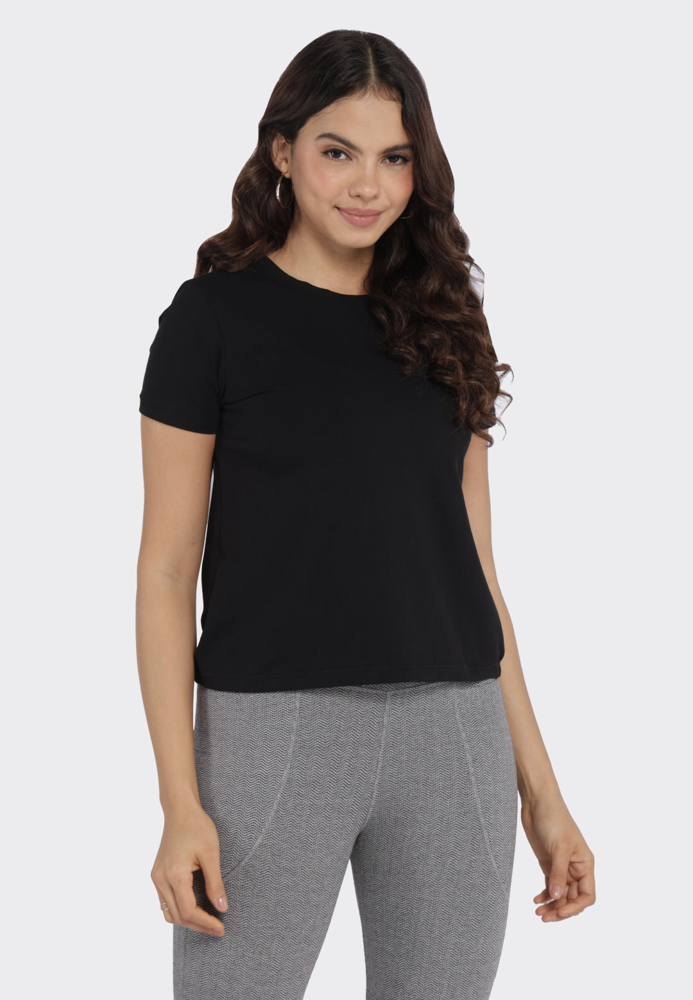

In [66]:
image_query1

In [67]:
#### stage1 model

image_query1_embedding_stage1 = encode_query(image_query1, dino_minilm_stage1, is_image = True)

top_images_stage1_image_query1 = find_most_similar(image_query1_embedding_stage1, list_image_embeddings_stage1, top_k=5, image = True)


#### stage2 model

image_query1_embedding_stage2 = encode_query(image_query1, dino_minilm_stage2, is_image = True)

top_images_stage2_image_query1 = find_most_similar(image_query1_embedding_stage2, list_image_embeddings_stage2, top_k=5, image = True)

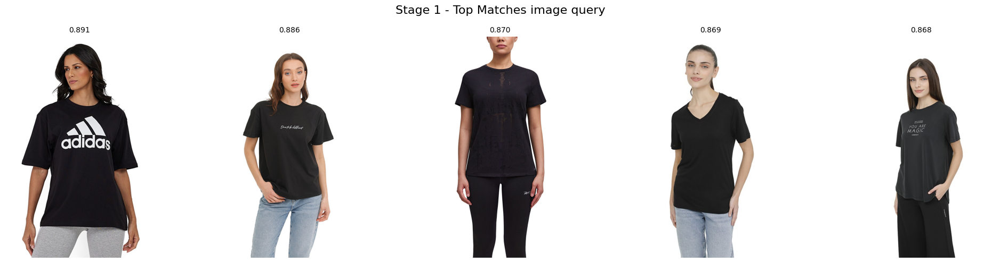

In [68]:
#### DISPLAY
show_images(top_images_stage1_image_query1, "Stage 1 - Top Matches image query")

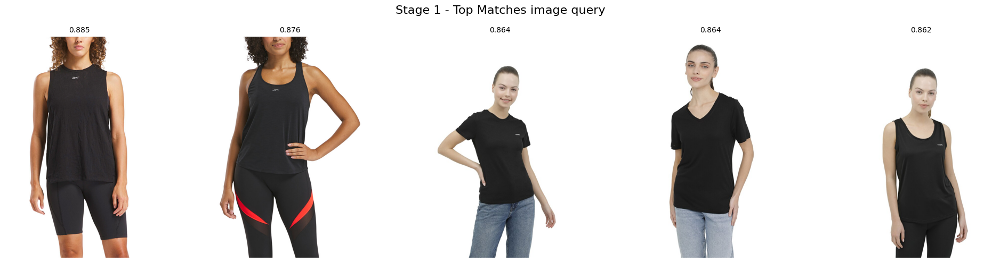

In [69]:
#### DISPLAY
show_images(top_images_stage2_image_query1, "Stage 1 - Top Matches image query")

##### QUERY 2

In [70]:
image_query2_url = "https://i5.walmartimages.com/seo/Softsoap-Liquid-Hand-Soap-Kitchen-and-Bathroom-Hand-Soap-Fresh-Breeze-7-5-Fluid-Ounce_dbef0790-3168-4ead-9772-9a9ad3b8e015.94f5cec5a9f0517fe2a8bab6fc0c7d6f.jpeg"
image_query2 = load_image(image_query2_url)

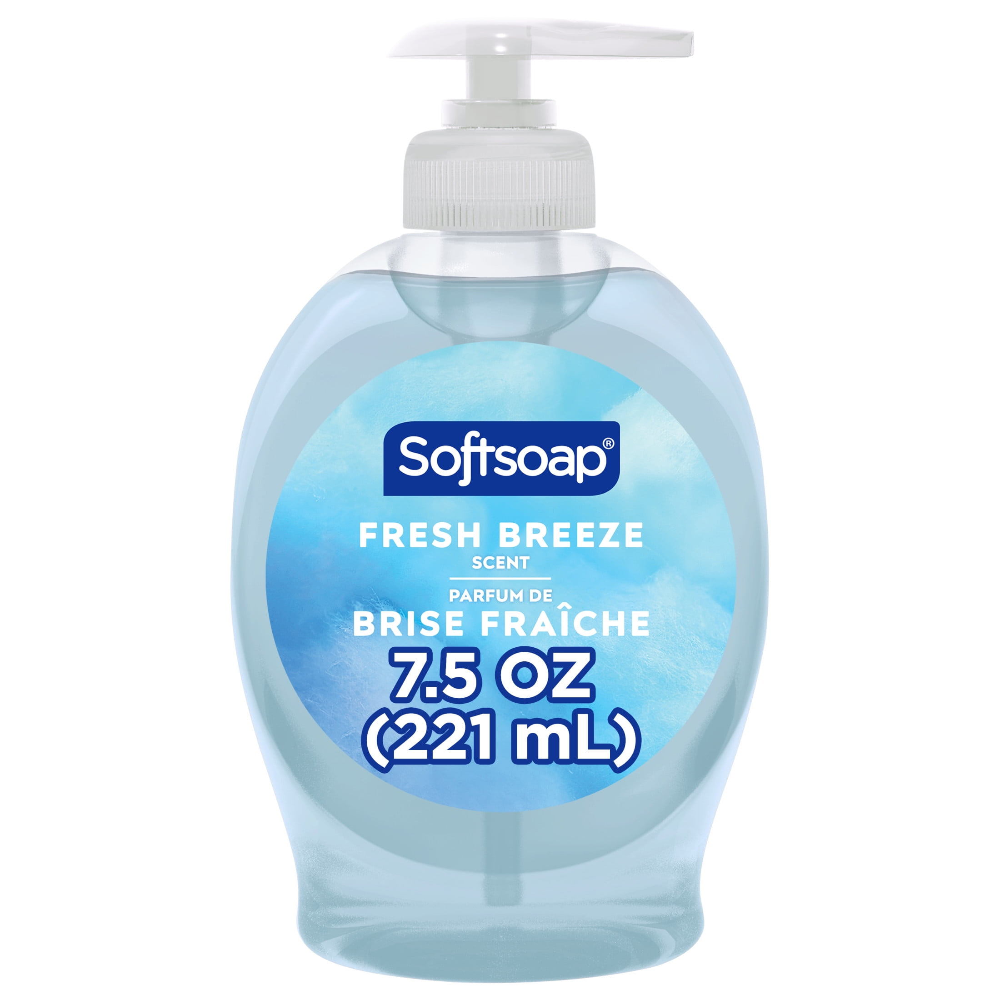

In [71]:
image_query2

In [72]:
#### stage1 model

image_query2_embedding_stage1 = encode_query(image_query2, dino_minilm_stage1, is_image = True)

top_images_stage1_image_query2 = find_most_similar(image_query2_embedding_stage1, list_image_embeddings_stage1, top_k=5, image = True)


#### stage2 model

image_query2_embedding_stage2 = encode_query(image_query2, dino_minilm_stage2, is_image = True)

top_images_stage2_image_query2 = find_most_similar(image_query2_embedding_stage2, list_image_embeddings_stage2, top_k=5, image = True)

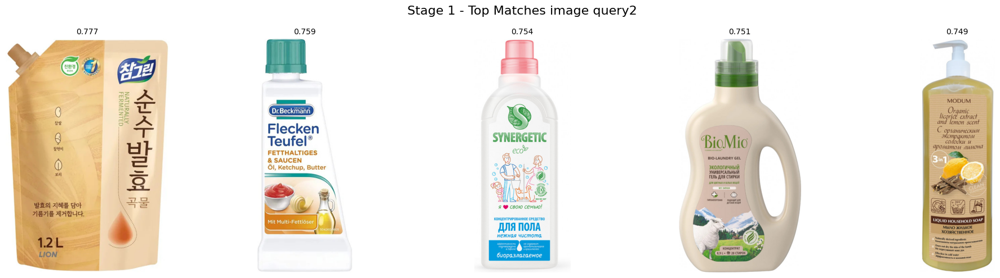

In [73]:
#### DISPLAY
show_images(top_images_stage1_image_query2, "Stage 1 - Top Matches image query2")

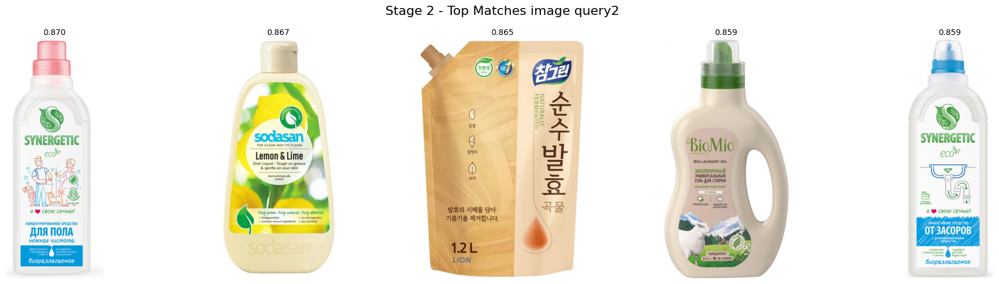

In [74]:
#### DISPLAY
show_images(top_images_stage2_image_query2, "Stage 2 - Top Matches image query2")

##### QUERY 3

In [80]:
image_query3_url = "https://www.tablicakalorijnosti.ru/file/image/foodstuff/659d3b30f9724d33a74f172db115daa9/559872c9d1dc4be0a07ecff159479c5a"
image_query3 = load_image(image_query3_url)

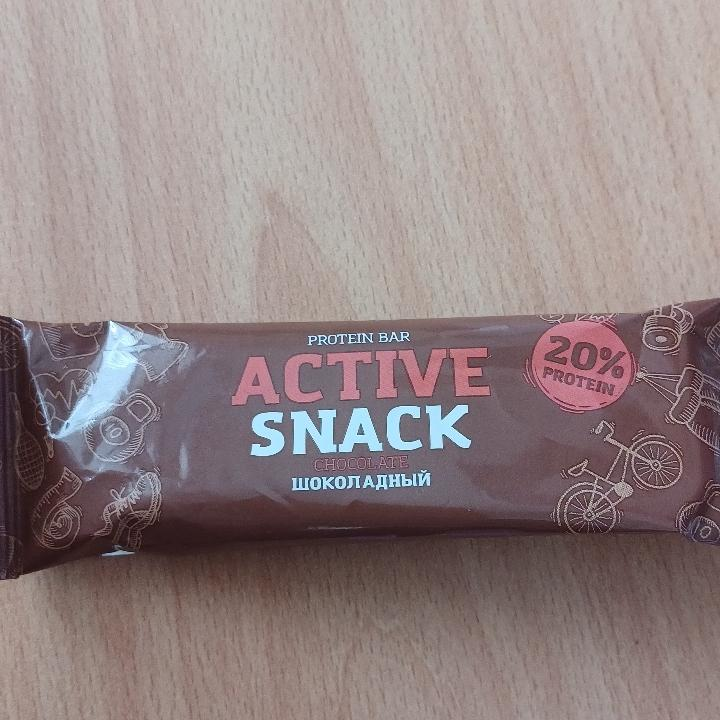

In [81]:
image_query3

In [82]:
#### stage1 model

image_query3_embedding_stage1 = encode_query(image_query3, dino_minilm_stage1, is_image = True)

top_images_stage1_image_query3 = find_most_similar(image_query3_embedding_stage1, list_image_embeddings_stage1, top_k=5, image = True)


#### stage2 model

image_query3_embedding_stage2 = encode_query(image_query3, dino_minilm_stage2, is_image = True)

top_images_stage2_image_query3 = find_most_similar(image_query3_embedding_stage2, list_image_embeddings_stage2, top_k=5, image = True)

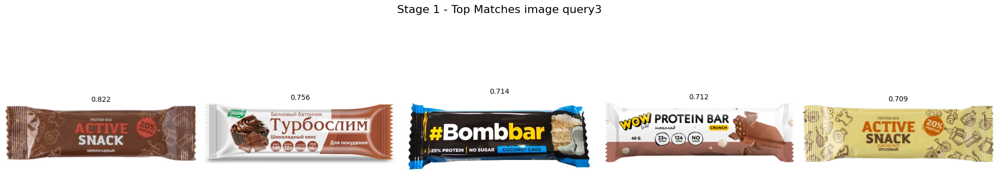

In [83]:
#### DISPLAY
show_images(top_images_stage1_image_query3, "Stage 1 - Top Matches image query3")

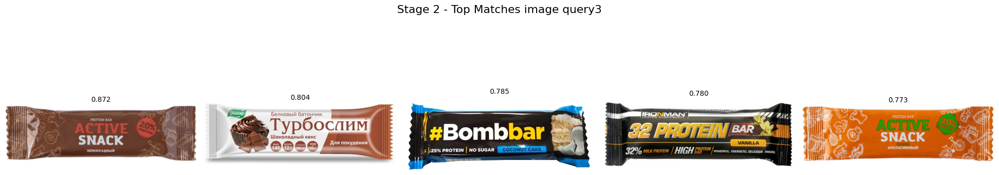

In [84]:
#### DISPLAY
show_images(top_images_stage2_image_query3, "Stage 2 - Top Matches image query3")

#### IMAGE SIM MATRIX

In [ ]:
image_dict = {"orange cat" : "https://hips.hearstapps.com/hmg-prod/images/portrait-of-cat-sitting-outdoors-royalty-free-image-1701438826.jpg?crop=0.66673xw:1xh;center,top&resize=1200:*",
              "white cat" : "https://ziggyfamily.com/cdn/shop/articles/chats-blancs-3_520x500_29f247a5-0663-457d-9d84-2152894d15b9.jpg?v=1748334872",
              "laptop" : "https://cdn.mos.cms.futurecdn.net/FUi2wwNdyFSwShZZ7LaqWf-1200-80.jpg",
              "monitor" : "https://cdn.thewirecutter.com/wp-content/media/2024/03/24inmonitors-2048px-232071-3x2-1.jpg?auto=webp&quality=75&crop=16:9,smart&width=1024",
              "black pants women" : "https://n.nordstrommedia.com/it/3fbedec7-46d2-4751-8638-9b2175d62e47.jpeg?h=368&w=240&dpr=2",
              "gray pants men" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQnLrGdc0r7tGXNuqRV3BbpEQTkFnHBFaQJTA&s",
              "toster" : "https://mi-store.pl/hpeciai/255142d422265fdbc7ffc2facdec95d1/pol_pl_Toster-Xiaomi-Toaster-3077_2.webp",
              "air fryer" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSCVyv-f3Tsxf7jMgh61OUABzEPwgSninnJsLPHVSf_qGaKR089_2Xbxa2Xlvi7ZiIg7jc&usqp=CAU"}

In [91]:
image_embeddings_stage1 = []
image_embeddings_stage2 = []


text_embeddings_stage1 = []
text_embeddings_stage2 = []

for name, url in image_dict.items():
  image = load_image(url)
  image_embedding_stage1 = encode_query(image, dino_minilm_stage1, is_image = True)
  text_embedding_stage1 = encode_query(name, dino_minilm_stage1, is_image = False)
  image_embeddings_stage1.append(image_embedding_stage1)
  text_embeddings_stage1.append(text_embedding_stage1)

  image_embedding_stage2 = encode_query(image, dino_minilm_stage2, is_image = True)
  text_embedding_stage2 = encode_query(name, dino_minilm_stage2, is_image = False)
  image_embeddings_stage2.append(image_embedding_stage2)
  text_embeddings_stage2.append(text_embedding_stage2)


In [92]:
image_matrix_stage1 = torch.stack(image_embeddings_stage1, dim=0).squeeze(1)
image_matrix_stage2 = torch.stack(image_embeddings_stage2, dim=0).squeeze(1)

text_matrix_stage1 = torch.stack(text_embeddings_stage1, dim=0).squeeze(1)
text_matrix_stage2 = torch.stack(text_embeddings_stage2, dim=0).squeeze(1)

In [93]:
image_matrix_stage1 = F.normalize(image_matrix_stage1, dim=1)
image_matrix_stage2 = F.normalize(image_matrix_stage2, dim=1)

text_matrix_stage1 = F.normalize(text_matrix_stage1, dim=1)
text_matrix_stage2 = F.normalize(text_matrix_stage2, dim=1)

In [88]:
image_matrix_stage2.shape

torch.Size([8, 768])

In [94]:
text_matrix_stage1.shape

torch.Size([8, 768])

In [95]:
image_matrix_stage1_sim_matrix = image_matrix_stage1 @ image_matrix_stage1.T
image_matrix_stage2_sim_matrix = image_matrix_stage2 @ image_matrix_stage2.T

text_matrix_stage1_sim_matrix = text_matrix_stage1 @ text_matrix_stage1.T
text_matrix_stage2_sim_matrix = text_matrix_stage2 @ text_matrix_stage2.T

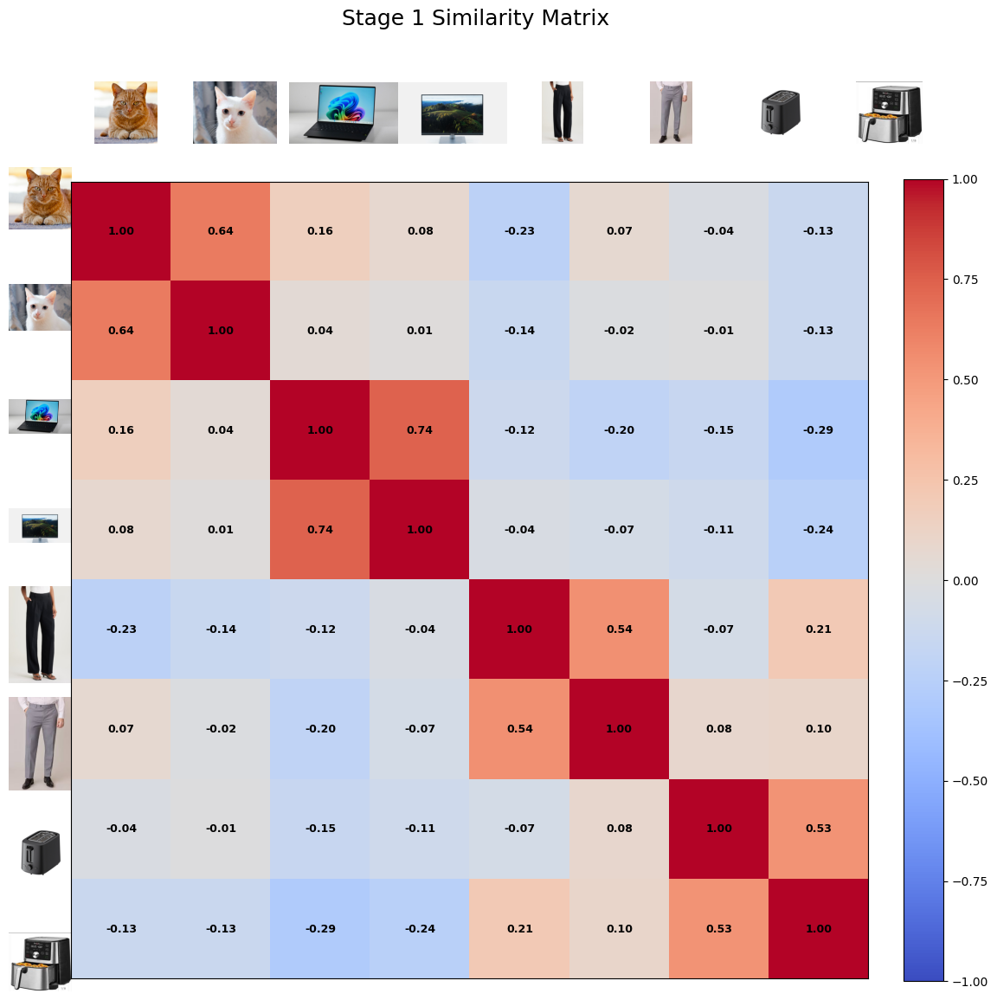

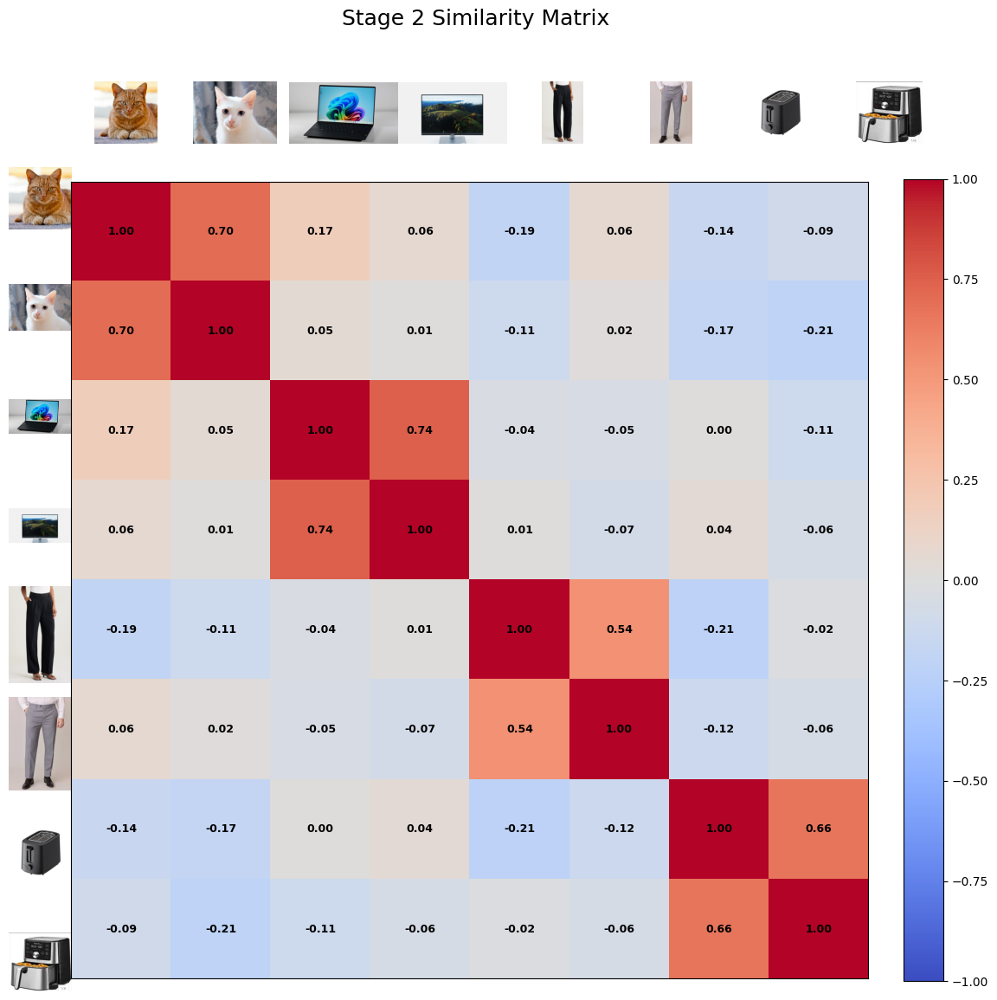

In [90]:
sim1 = image_matrix_stage1_sim_matrix.detach().cpu().numpy()
sim2 = image_matrix_stage2_sim_matrix.detach().cpu().numpy()
images = [load_image(url) for url in image_dict.values()]
n = len(images)

# plot both
plot_similarity_matrix(sim1, images, "Stage 1 Similarity Matrix")
plot_similarity_matrix(sim2, images, "Stage 2 Similarity Matrix")


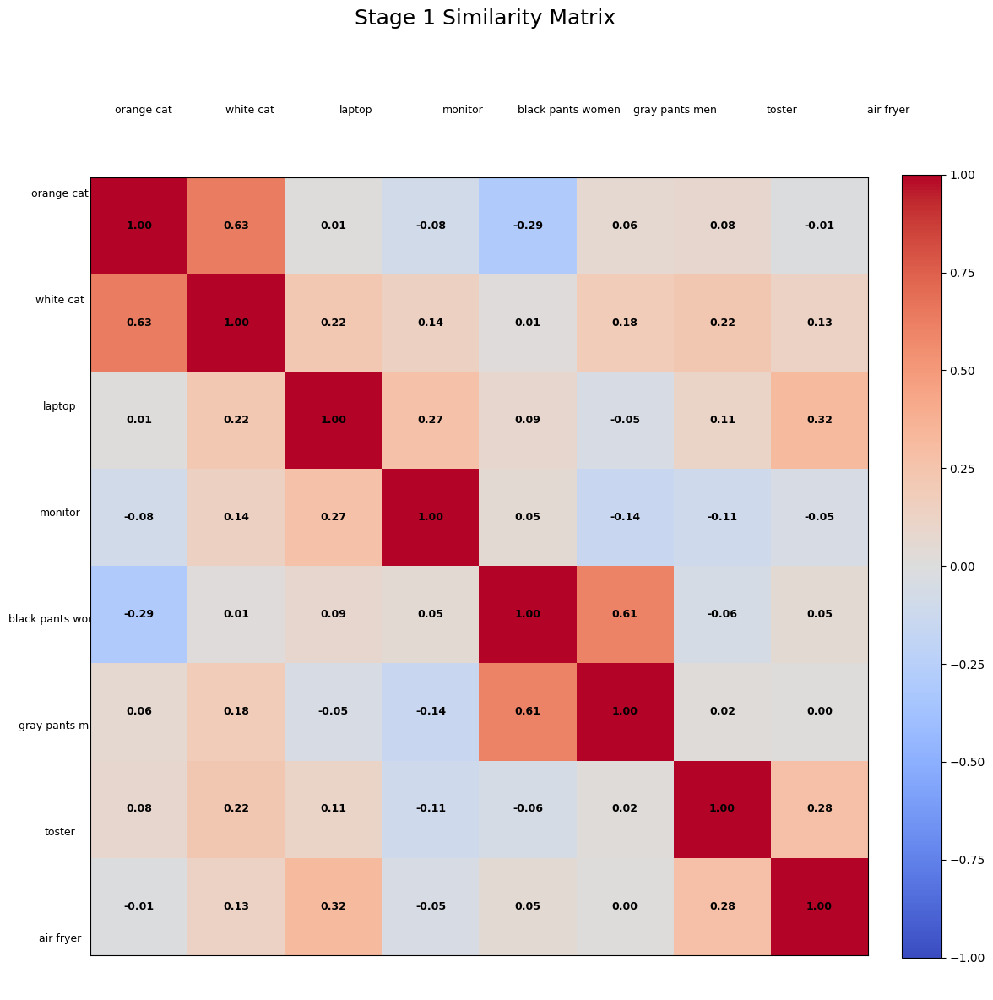

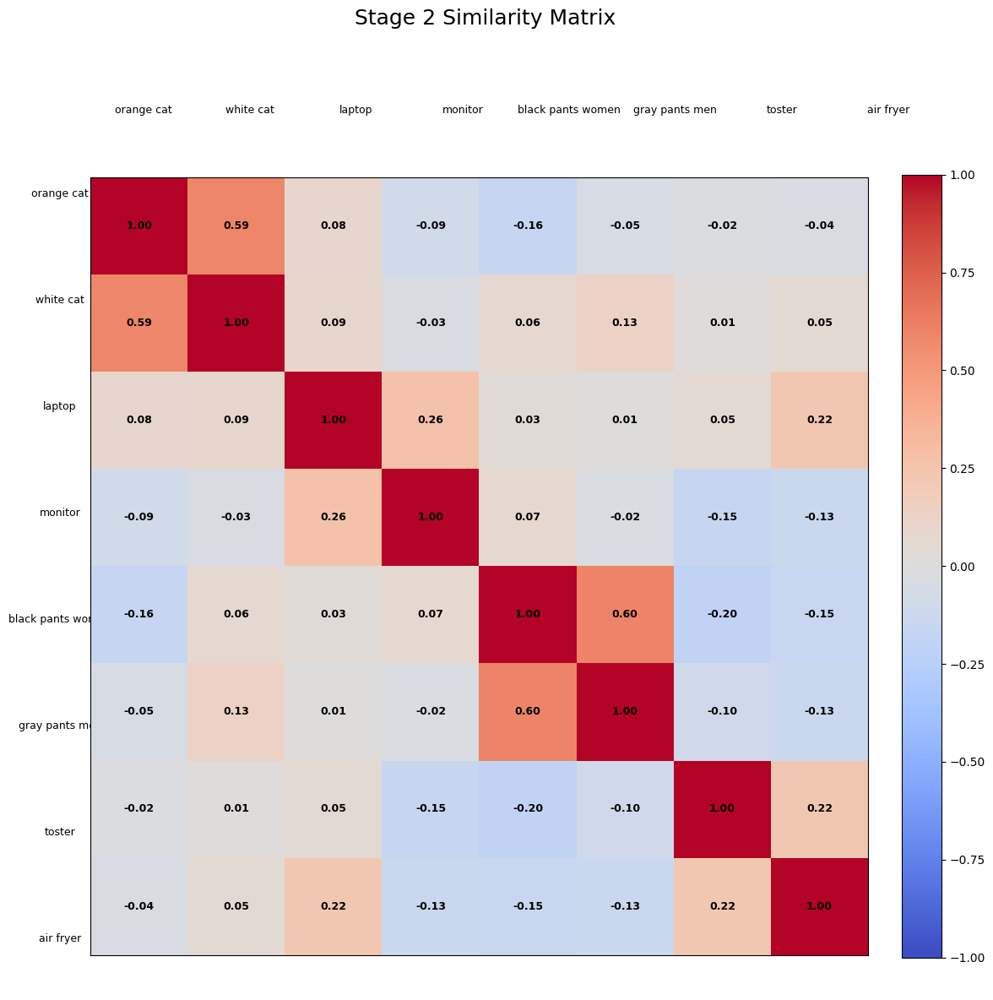

In [98]:
sim1_text = text_matrix_stage1_sim_matrix.detach().cpu().numpy()
sim2_text = text_matrix_stage2_sim_matrix.detach().cpu().numpy()

plot_similarity_matrix(sim1_text, list(image_dict.keys()), "Stage 1 Similarity Matrix", image = False,)
plot_similarity_matrix(sim2_text, list(image_dict.keys()), "Stage 2 Similarity Matrix", image = False,)